# Capstone Project
# Part 1 Data Preparation

# 0) Data retreiving from data sources -

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import json
import matplotlib.pyplot as plt
import math
from geopy.geocoders import Nominatim
import requests
import folium

In [2]:
#read json data files of each prefecture and put it into a list
#order: saitama->chiba->tokyo->kanagawa
prefecture_raw = []

files = ['L01-19_11.geojson','L01-19_12.geojson','L01-19_13.geojson','L01-19_14.geojson']#saitama, chiba, tokyo, kanagawa

for file in files:
    with open(file) as json_data:
        prefecture_raw.append(json.load(json_data))

In [3]:
#get data under 'features' tag frow raw data in the list
prefecture = []
for i in range(0,4):
    prefecture.append(prefecture_raw[i]['features'])

In [4]:
#create four null dataframes

df_list=[]

column_names = ['City', 'Station','DistToSt','LandValue','Latitude', 'Longitude'] 

for i in range(0,4):
    df = pd.DataFrame(columns=column_names)
    df_list.append(df)

In [5]:
#retrive relevant data 

for i in range(0,4):
    for data in prefecture[i]:  
        if data['properties']['L01_025']!='住宅':
            continue
        city = str(data['properties']['L01_022'])
        station = str(data['properties']['L01_045'])
        distance = float(data['properties']['L01_046'])
        landvalue = float(data['properties']['L01_006'])
        landtype = str(data['properties']['L01_025'])
        latlon = data['geometry']['coordinates']
        lat = float(latlon[1])
        lon = float(latlon[0])
    
        df_list[i] = df_list[i].append({'City': city,
                                    'Station': station,
                                    'DistToSt': distance,    
                                    'LandValue': landvalue,
                                    'Latitude': lat,
                                    'Longitude': lon}, ignore_index=True)

In [6]:
df_saitama_raw = df_list[0]
df_chiba_raw = df_list[1]
df_tokyo_raw = df_list[2]
df_kanagawa_raw = df_list[2]
df_list_raw = [df_saitama_raw, df_chiba_raw, df_tokyo_raw, df_kanagawa_raw]

In [7]:
df_kanto_raw = pd.concat([df_saitama_raw, df_chiba_raw, df_tokyo_raw, df_kanagawa_raw])

,DistToSt,LandValue,Latitude,Longitude
count,1369.000000,1.369000e+03,1369.000000,1369.000000
mean,1139.379109,3.398191e+05,35.668624,139.562985
std,1028.696079,2.282182e+05,0.363178,0.197097
min,60.000000,5.700000e+03,27.094912,139.136421
25%,530.000000,1.730000e+05,35.649419,139.434175
50%,850.000000,2.920000e+05,35.697142,139.558162
75%,1400.000000,4.420000e+05,35.740038,139.683221
max,9100.000000,1.920000e+06,35.828359,142.203355


# - Data understanding -

# Visualizing on a map 

In [8]:
#get position data of city hall of prefecture capital and Tokyo station

name_list = ['さいたま市役所', '千葉市役所', '東京都庁', '横浜市役所','東京駅']
lat_list = []
lon_list = []

for i in range(0,5):
    address = name_list[i]
    geolocator = Nominatim(user_agent="kanto_explorer")
    location = geolocator.geocode(address)
    lat_list.append(location.latitude)
    lon_list.append(location.longitude)

In [9]:
center_lat = lat_list[4]
center_lon = lon_list[4]

map_kanto = folium.Map(location=[center_lat, center_lon], zoom_start=10)
bounds = [200000, 400000, 600000, 800000, 10000000]
colorlist = ['yellow', 'orange', 'violet', 'crimson','purple', 'indigo']

# add markers to map,
for i in range(0,4):
    for lat, lng, price in zip(df_list_raw[i]['Latitude'], df_list_raw[i]['Longitude'], df_list_raw[i]['LandValue']):
        if price < bounds[0]:
            col=colorlist[0]
        elif price < bounds[1]:
            col=colorlist[1]
        elif price < bounds[2]:
            col=colorlist[2]
        elif price < bounds[3]:
            col=colorlist[3]
        elif price < bounds[4]:
            col=colorlist[4]
        else:
            col=colorlist[5]        
    
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=str(price),
            stroke=False,
            color=col,
            fill=True,
            fill_opacity=0.5,
            parse_html=False).add_to(map_kanto)  
        
        folium.Circle([lat_list[i],
                       lon_list[i]],
                       radius=10000,
                       tooltip='10km',
                       color="blue",
                       fill_color=None).add_to(map_kanto)
map_kanto

Visualizing data properties

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


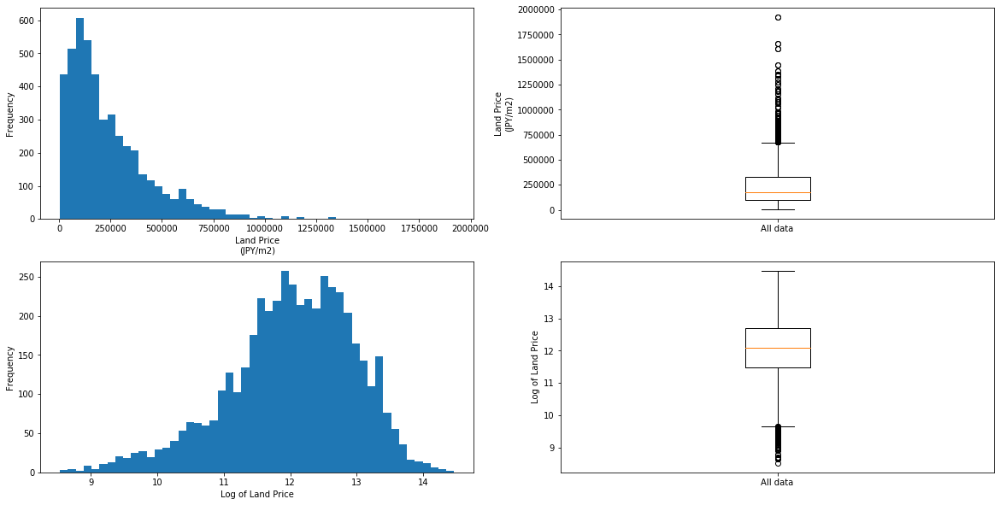

In [11]:
landprice = np.array(df_kanto_raw['LandValue']).astype(float)
landprice_ln = np.log(landprice)

fig = plt.figure(1, figsize=(20, 10))

ax = fig.add_subplot(221)
ax.hist(landprice, bins=50)
ax.set_ylabel('Frequency')
ax.set_xlabel('Land Price\n(JPY/m2)')

ax = fig.add_subplot(222)
ax.boxplot(landprice, labels=['All data'])
ax.set_ylabel('Land Price\n(JPY/m2)')


ax = fig.add_subplot(223)
ax.hist(landprice_ln, bins=50)
ax.set_ylabel('Frequency')
ax.set_xlabel('Log of Land Price')

ax = fig.add_subplot(224)
ax.boxplot(landprice_ln, labels=['All data'])
ax.set_ylabel('Log of Land Price')

fig.show()

# - Data Prepartion -
# 1) Distance data

In [12]:
#Define function which calculate distance to Tokyo station

def point_dist(lat_1, lon_1, lat_2, lon_2):

    R = 6373.0

    lat1 = math.radians(lat_1)
    lon1 = math.radians(lon_1)
    lat2 = math.radians(lat_2)
    lon2 = math.radians(lon_2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = math.sin(dlat / 2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))

    distance = R * c
    return distance

In [13]:
#calculate distance to Tokyo station

lat_tkst = lat_list[4]
lon_tkst = lon_list[4]

for i in range(0,4):
    distance = []
    for lat, lon in zip(df_list[i]['Latitude'], df_list[i]['Longitude']):
        d = point_dist(lat_tkst, lon_tkst, lat, lon)
        distance.append(d)
    df_list[i]['ToTokyoST'] = np.array(distance)

In [14]:
#calculate distance to City Hall

for i in range(0,4):
    distance = []
    for lat, lon in zip(df_list[i]['Latitude'], df_list[i]['Longitude']):
        d = point_dist(lat_list[i], lon_list[i], lat, lon)
        distance.append(d)
    df_list[i]['ToCityHall'] = np.array(distance)

In [15]:
df_list[0].head(5)

,City,Station,DistToSt,LandValue,Latitude,Longitude,ToTokyoST,ToCityHall
0,小鹿野,秩父,14000.0,25700.0,36.022335,139.003067,78.802873,60.542365
1,小鹿野,秩父,12000.0,21500.0,36.012412,139.021927,76.784894,58.599773
2,秩父,御花畑,900.0,60100.0,35.989768,139.077127,71.218056,53.131900
3,秩父,御花畑,750.0,59900.0,35.995823,139.077471,71.516544,53.284929
4,秩父,秩父,800.0,53200.0,36.003158,139.081972,71.566058,53.129681


# 2) Filtering

In [16]:
#filterd by the value of the distance to

df_fltrd = []
for i in range(0,4):
    df = df_list[i]
    df = df[df['ToCityHall'] < 10].reset_index(drop=True)
    df_fltrd.append(df)

In [17]:
df_fltrd[0].describe(include = ['object','int','float'])

,City,Station,DistToSt,LandValue,Latitude,Longitude,ToTokyoST,ToCityHall
count,267,267,267.000000,267.000000,267.000000,267.000000,267.000000,267.000000
unique,20,50,NaN,NaN,NaN,NaN,NaN,NaN
top,川口,蕨,NaN,NaN,NaN,NaN,NaN,NaN
freq,63,22,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,1395.955056,210765.917603,35.856829,139.650725,22.810849,6.231632
std,NaN,NaN,870.202274,76077.778756,0.041599,0.054207,4.743259,2.612952
min,NaN,NaN,300.000000,29800.000000,35.785634,139.537278,13.963422,0.288330
25%,NaN,NaN,750.000000,155000.000000,35.824432,139.610477,18.850386,4.086466
50%,NaN,NaN,1100.000000,201000.000000,35.850724,139.652052,22.404159,6.692085
75%,NaN,NaN,1800.000000,265000.000000,35.885886,139.694676,26.290577,8.312827


/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


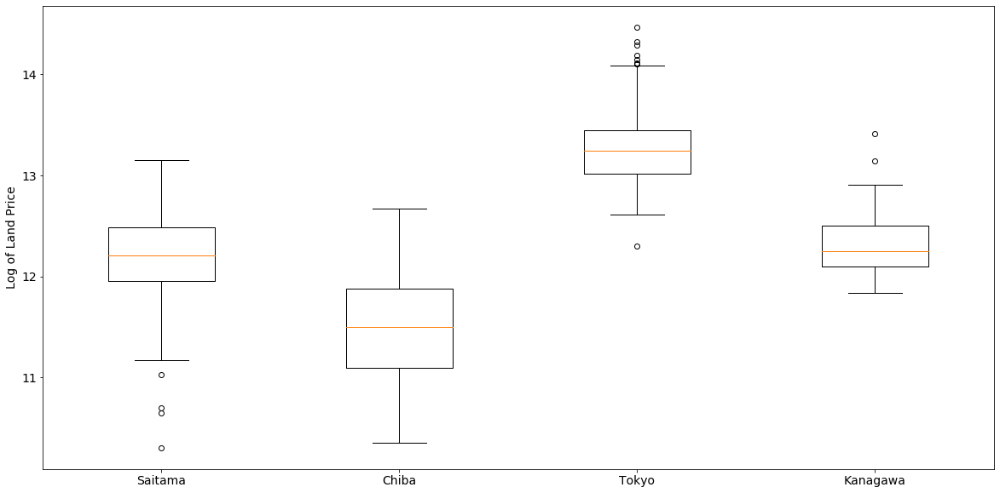

In [36]:
LandPrices=[]
for i in range(0,4):
    df = df_fltrd[i]
    landprice = np.log(df['LandValue'])
    LandPrices.append(landprice)

fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)

ax.boxplot(LandPrices, labels=['Saitama','Chiba','Tokyo','Kanagawa'])
ax.set_ylabel('Log of Land Price',fontsize=14)
ax.tick_params(labelsize=14)

fig.show()

# 3) Additional attribute
# Count of neaby stations with Foursquare API and summarize in dataframes

In [37]:
CLIENT_ID = 'WB4X0EHJO13IAJZ4BYH0SFM0DIRAWA1EXGTB5MGG4XYDIRQQ' # your Foursquare ID
CLIENT_SECRET = 'M4NYEYIMRITJLWI3AWHRRAQ53HGDRIEYHGN5FLG0CDCT4PQ3' # your Foursquare Secret
VERSION = '20200317' # Foursquare API version
LIMIT = 50

SEARCH = 'station'
CATEGORY_ID = {'Train Station':'4bf58dd8d48988d129951735',
               'Metro Station':'4bf58dd8d48988d1fd931735',
               'Tram Station':'4bf58dd8d48988d1fc931735'}



In [38]:
def countstation(names, latitudes, longitudes, radius=500):
    counts = []
    ctid1 = CATEGORY_ID.get('Train Station')
    ctid2 = CATEGORY_ID.get('Metro Station')
    ctid3 = CATEGORY_ID.get('Tram Station')
    
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)    
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={},{},{}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT,
            ctid1,
            ctid2,
            ctid3
        )
            
        # make the GET request
        try:
            results = requests.get(url).json()["response"]['venues']
            count = len(results)  
            counts.append(count)
        except:
            count = 0
            counts.append(count)
            continue
            
    return(counts)

In [39]:
counts_list = []

for i in range(0,4):
    counts = countstation(names=df_fltrd[i]['City'],
                                   latitudes=df_fltrd[i]['Latitude'],
                                   longitudes=df_fltrd[i]['Longitude']
                                  )
    counts_list.append(counts)

ふじみ野
富士見
富士見
富士見
三芳
富士見
富士見
富士見
新座
富士見
富士見
富士見
新座
新座
さいたま西
新座
志木
さいたま西
さいたま西
新座
新座
志木
志木
志木
新座
朝霞
新座
さいたま西
富士見
さいたま西
志木
さいたま西
朝霞
志木
朝霞
朝霞
朝霞
さいたま西
朝霞
朝霞
朝霞
志木
さいたま西
さいたま西
朝霞
朝霞
朝霞
朝霞
さいたま北
さいたま北
大宮
朝霞
朝霞
朝霞
大宮
朝霞
さいたま北
さいたま北
朝霞
さいたま北
桜
大宮
桜
さいたま北
桜
和光
桜
さいたま中央
大宮
さいたま北
和光
朝霞
さいたま北
大宮
大宮
さいたま中央
さいたま北
さいたま中央
和光
桜
和光
和光
さいたま北
さいたま北
和光
桜
さいたま中央
さいたま北
和光
桜
さいたま中央
さいたま中央
さいたま中央
さいたま中央
大宮
さいたま南
さいたま中央
さいたま北
桜
和光
大宮
さいたま北
桜
さいたま中央
大宮
さいたま中央
さいたま南
さいたま北
さいたま南
大宮
大宮
大宮
戸田
さいたま中央
戸田
さいたま南
浦和
大宮
さいたま中央
大宮
見沼
大宮
浦和
浦和
浦和
さいたま南
浦和
さいたま南
浦和
見沼
さいたま南
浦和
さいたま南
戸田
見沼
戸田
浦和
見沼
浦和
さいたま南
浦和
見沼
さいたま南
見沼
見沼
見沼
浦和
浦和
戸田
戸田
浦和
さいたま南
浦和
浦和
さいたま南
戸田
浦和
見沼
見沼
蕨
浦和
さいたま緑
戸田
見沼
見沼
戸田
さいたま南
さいたま緑
さいたま緑
さいたま南
さいたま緑
さいたま南
戸田
さいたま緑
川口
さいたま緑
戸田
蕨
川口
戸田
さいたま南
さいたま緑
見沼
岩槻
川口
さいたま南
蕨
川口
さいたま南
戸田
さいたま緑
さいたま南
川口
戸田
岩槻
さいたま緑
蕨
蕨
さいたま緑
川口
蕨
戸田
川口
さいたま緑
川口
川口
さいたま緑
川口
川口
川口
川口
川口
川口
川口
川口
川口
川口
川口
さいたま緑
川口
川口
川口
川口
さいたま緑
川口
川口
川口
川口
川口
川口
川口
川口
川口
岩槻
川口
川口
川口
川口
川口
川口
川口
川口
川口
川口
川口
川口
さいたま緑
川口
川口
川口
川口
川口
さいたま緑
川口
川口
川口
川口
川口


In [40]:
for i in range(0,4):
    df_fltrd[i]['Stations']=np.array(counts_list[i])
    df_fltrd[i] = df_fltrd[i][['City', 'Latitude', 'Longitude', 'Stations', 'Station', 'DistToSt', 'ToCityHall', 'ToTokyoST','LandValue']]

In [41]:
df_fltrd[0]#Saitama

,City,Latitude,Longitude,Stations,Station,DistToSt,ToCityHall,ToTokyoST,LandValue
0,ふじみ野,35.872763,139.537278,0,ふじみ野,2500.0,9.823200,29.884129,134000.0
1,富士見,35.855106,139.537822,0,鶴瀬,1100.0,9.723353,28.478432,165000.0
2,富士見,35.859945,139.540321,0,鶴瀬,1900.0,9.472695,28.684975,142000.0
3,富士見,35.840844,139.542992,0,鶴瀬,1000.0,9.515581,27.070457,181000.0
4,三芳,35.826179,139.544807,0,みずほ台,1600.0,9.887371,25.899016,74000.0
...,...,...,...,...,...,...,...,...,...
262,川口,35.861304,139.749783,1,戸塚安行,550.0,9.411115,20.169132,204000.0
263,川口,35.878242,139.749853,0,東川口,760.0,9.596559,22.046417,192000.0
264,川口,35.857039,139.751566,1,戸塚安行,500.0,9.585482,19.683158,150000.0
265,川口,35.839660,139.752023,0,新井宿,1400.0,9.919205,17.753221,131000.0


In [42]:
df_fltrd[1]#Chiba

,City,Latitude,Longitude,Stations,Station,DistToSt,ToCityHall,ToTokyoST,LandValue
0,美浜,35.667583,140.033970,0,幕張本郷,1400.0,9.376699,24.007738,162000.0
1,花見川,35.659115,140.043788,0,海浜幕張,1700.0,8.083020,24.967237,155000.0
2,花見川,35.667628,140.044566,0,幕張本郷,750.0,8.737114,24.963191,247000.0
3,習志野,35.679011,140.048074,0,幕張本郷,950.0,9.563366,25.237068,163000.0
4,花見川,35.664178,140.048537,0,幕張本郷,1200.0,8.212586,25.346754,137000.0
...,...,...,...,...,...,...,...,...,...
170,若葉,35.625578,140.186321,2,千城台北,450.0,7.492046,38.233305,78700.0
171,千葉緑,35.553984,140.186769,0,鎌取,1400.0,9.375807,40.336841,97000.0
172,若葉,35.616902,140.193583,0,千城台,900.0,7.941135,39.046978,70600.0
173,四街道,35.632627,140.193677,0,都賀,5000.0,8.363919,38.772308,56200.0


In [43]:
df_fltrd[2]#Tokyo

,City,Latitude,Longitude,Stations,Station,DistToSt,ToCityHall,ToTokyoST,LandValue
0,武蔵野,35.710699,139.584039,0,吉祥寺,960.0,9.998406,17.018053,560000.0
1,調布,35.670318,139.586601,0,仙川,1000.0,9.735226,16.498822,351000.0
2,三鷹,35.678447,139.587580,0,三鷹台,2000.0,9.487364,16.371411,301000.0
3,武蔵野,35.700362,139.587689,3,吉祥寺,900.0,9.467431,16.504097,653000.0
4,武蔵野,35.704320,139.588387,0,吉祥寺,800.0,9.470161,16.505738,595000.0
...,...,...,...,...,...,...,...,...,...
347,荒川,35.733465,139.781418,3,三河島,350.0,9.454078,5.987006,414000.0
348,台東,35.725799,139.782646,4,鶯谷,760.0,9.144642,5.178347,539000.0
349,中央,35.663922,139.786507,7,月島,160.0,9.036345,2.454806,820000.0
350,江東,35.682780,139.794952,9,清澄白河,370.0,9.362588,2.378659,565000.0


In [44]:
df_fltrd[3]#Kanagawa

,City,Latitude,Longitude,Stations,Station,DistToSt,ToCityHall,ToTokyoST,LandValue
0,横浜泉,35.440930,139.527899,2,緑園都市,700.0,9.984863,34.435997,245000.0
1,横浜旭,35.458361,139.529207,2,二俣川,1000.0,9.989918,32.878013,196000.0
2,戸塚,35.437103,139.530479,0,緑園都市,1100.0,9.775163,34.621071,157000.0
3,横浜旭,35.454901,139.531406,1,二俣川,1100.0,9.737762,33.039019,240000.0
4,横浜旭,35.471425,139.533976,0,二俣川,1200.0,9.911230,31.506105,176000.0
...,...,...,...,...,...,...,...,...,...
220,横浜鶴見,35.505880,139.686688,0,京急鶴見,900.0,8.181897,20.806649,287000.0
221,横浜鶴見,35.512986,139.692186,0,鶴見市場,900.0,9.115972,19.891581,284000.0
222,川崎,35.514899,139.694512,2,川崎,2500.0,9.408876,19.619226,279000.0
223,川崎,35.504901,139.698755,1,川崎,3400.0,8.734178,20.546284,246000.0


# *Save data 

In [45]:
#save all datas as csv format
df_fltrd[0].to_csv('saitama.csv')
df_fltrd[1].to_csv('chiba.csv')
df_fltrd[2].to_csv('tokyo.csv')
df_fltrd[3].to_csv('kanagawa.csv')
df_list[0].to_csv('saitama_raw.csv')
df_list[1].to_csv('chiba_raw.csv')
df_list[2].to_csv('tokyo_raw.csv')
df_list[3].to_csv('kanagawa_raw.csv')

# Part 2
# Data analysis

In [57]:
import pandas as pd
import numpy as np
import geopandas as gpd
import json
import matplotlib.pyplot as plt
import matplotlib as mpl
import math
from geopy.geocoders import Nominatim
import requests
import folium
import seaborn as sns
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor as RFR
from sklearn.model_selection import train_test_split

# *Read data

In [46]:
df_saitama = pd.read_csv('saitama.csv', index_col=[0])
df_chiba = pd.read_csv('chiba.csv', index_col=[0])
df_tokyo = pd.read_csv('tokyo.csv', index_col=[0])
df_kanagawa = pd.read_csv('kanagawa.csv', index_col=[0])
df_list = [df_saitama, df_chiba, df_tokyo, df_kanagawa]

# Preparation of data set for analysis

In [47]:
df_kanto=pd.concat([df_saitama, df_chiba, df_tokyo, df_kanagawa])
df_kanto

,City,Latitude,Longitude,Stations,Station,DistToSt,ToCityHall,ToTokyoST,LandValue
0,ふじみ野,35.872763,139.537278,0,ふじみ野,2500.0,9.823200,29.884129,134000.0
1,富士見,35.855106,139.537822,0,鶴瀬,1100.0,9.723353,28.478432,165000.0
2,富士見,35.859945,139.540321,0,鶴瀬,1900.0,9.472695,28.684975,142000.0
3,富士見,35.840844,139.542992,0,鶴瀬,1000.0,9.515581,27.070457,181000.0
4,三芳,35.826179,139.544807,0,みずほ台,1600.0,9.887371,25.899016,74000.0
...,...,...,...,...,...,...,...,...,...
220,横浜鶴見,35.505880,139.686688,0,京急鶴見,900.0,8.181897,20.806649,287000.0
221,横浜鶴見,35.512986,139.692186,0,鶴見市場,900.0,9.115972,19.891581,284000.0
222,川崎,35.514899,139.694512,2,川崎,2500.0,9.408876,19.619226,279000.0
223,川崎,35.504901,139.698755,1,川崎,3400.0,8.734178,20.546284,246000.0


In [50]:
#Cleaning dataframe for regression
df_kanto = df_kanto.sort_values('LandValue').reset_index(drop=True)

df_kanto_anal = df_kanto[['Stations', 'DistToSt', 'ToCityHall', 'ToTokyoST','LandValue']]

LogValue = np.log(df_kanto_anal[['LandValue']].values)

df_kanto_anal['LogValue']= LogValue

df_kanto_anal

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,Stations,DistToSt,ToCityHall,ToTokyoST,LandValue,LogValue
0,0,3900.0,9.679512,27.572543,29800.0,10.302264
1,0,8000.0,7.039010,38.625657,31500.0,10.357743
2,0,1700.0,9.821689,30.219071,32000.0,10.373491
3,0,5300.0,9.997029,38.890954,32800.0,10.398184
4,0,3100.0,9.840500,37.759704,36800.0,10.513253
...,...,...,...,...,...,...
1014,9,310.0,6.370946,5.811658,1390000.0,14.144814
1015,0,720.0,4.176302,7.417678,1450000.0,14.187074
1016,0,840.0,5.832020,4.778504,1610000.0,14.291745
1017,3,900.0,4.124020,7.274164,1660000.0,14.322328


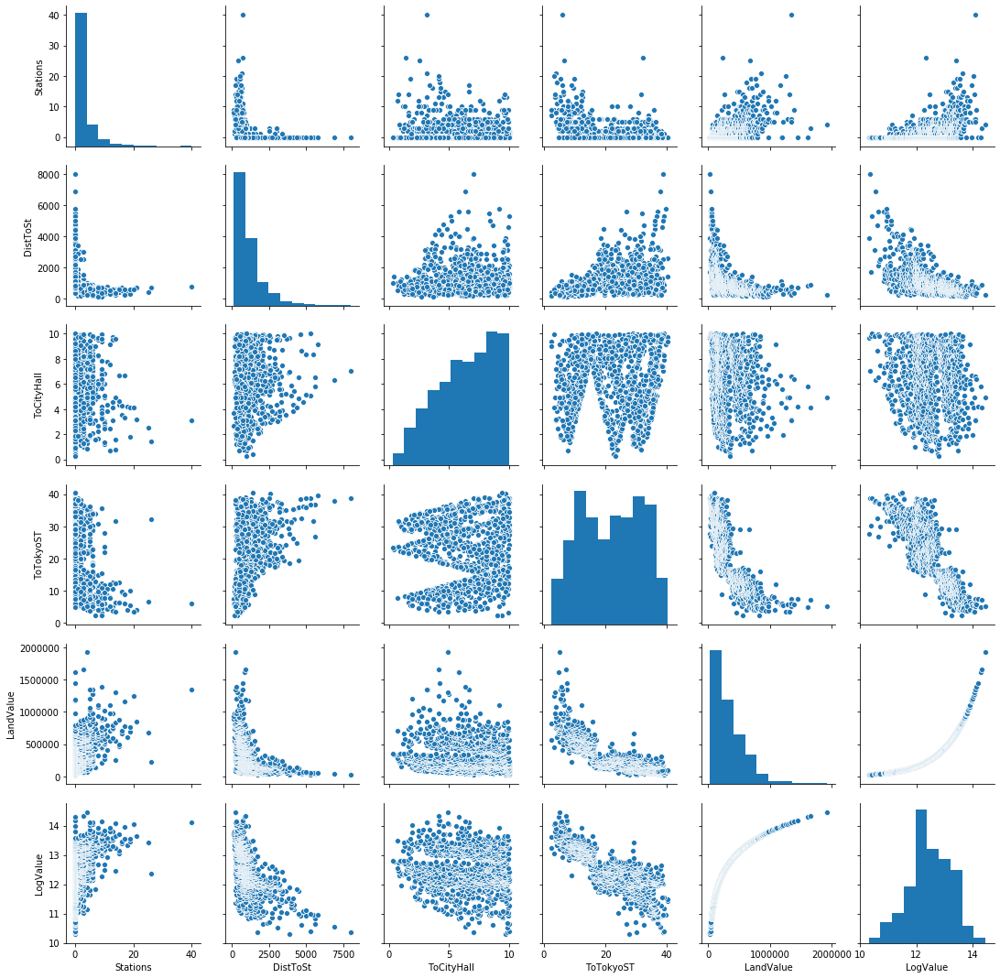

In [53]:
sns.pairplot(df_kanto_anal)

# Modeling

# 1) dividing data set into train data and test data

In [55]:
data = df_kanto_anal[['Stations', 'DistToSt', 'ToCityHall', 'ToTokyoST']].values
target = np.ravel(df_kanto_anal['LogValue'])

In [63]:
X_train, X_test, Y_train, Y_test \
= train_test_split(data, target, test_size=0.25, random_state=0)

# 2) Predicting with ridge regression

In [64]:
clf_RD= Ridge(alpha=1.0)
clf_RD.fit(X_train, Y_train)
Y_predict_RD = clf_RD.predict(X_test)

r2_score(Y_test, Y_predict_RD)

0.7958042193406865

# 3) Predicting with random forest regression

In [62]:
clf_RFR = RFR(n_estimators=100)
clf_RFR.fit(X_train, Y_train)
Y_predict_RFR = clf_RFR.predict(X_test)
r2_score(Y_test, Y_predict_RFR)

0.8315961314653476

# 4) Evaluation of the model

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  from ipykernel import kernelapp as app


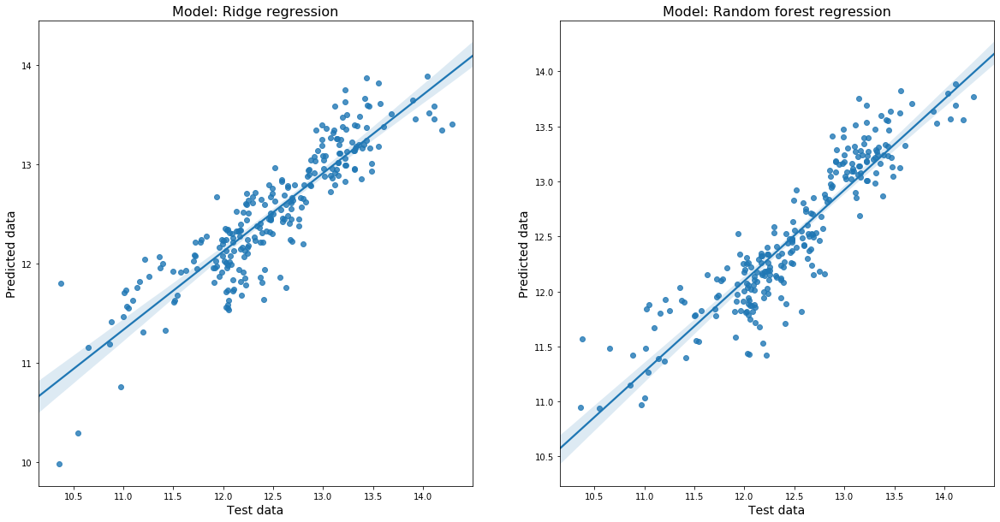

In [73]:
fig = plt.figure(1, figsize=(20, 10))

ax = fig.add_subplot(1,2,1)
sns.regplot(Y_test, Y_predict_RD)
ax.set_xlabel('Test data', fontsize=14)
ax.set_ylabel('Predicted data', fontsize=14)
ax.set_title('Model: Ridge regression',fontsize=16)

ax = fig.add_subplot(1,2,2)
sns.regplot(Y_test, Y_predict_RFR)
ax.set_xlabel('Test data', fontsize=14)
ax.set_ylabel('Predicted data', fontsize=14)
ax.set_title('Model: Random forest regression',fontsize=16)

# fig.show()

# Deployment
# Predicting land price using RFR model

In [74]:
Y_predict = clf_RFR.predict(data)
r2_score(target, Y_predict)

0.9385780251497196

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


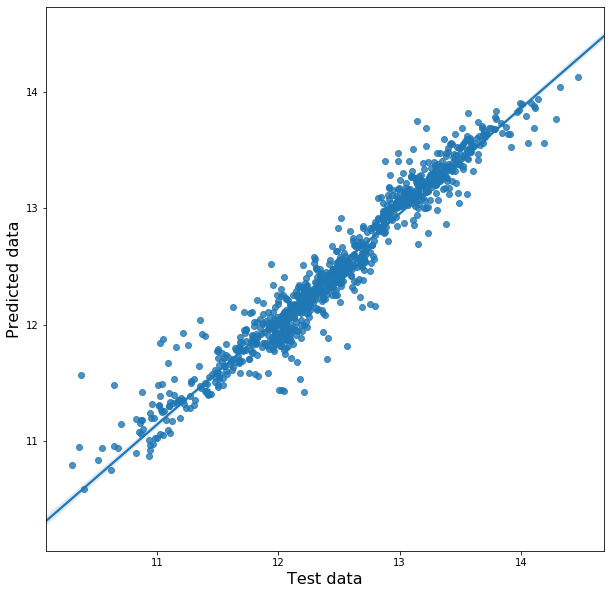

In [76]:
fig = plt.figure(1, figsize=(10, 10))
ax = fig.add_subplot(1,1,1)

sns.regplot(target, Y_predict)
ax.set_xlabel('Test data', fontsize=16)
ax.set_ylabel('Predicted data', fontsize=16)

fig.show()

In [79]:
Y = np.exp(Y_predict)
y = np.exp(target)

delta = (y-Y)/y

In [84]:
df_kanto['PredictValue']= Y.astype(int)
df_kanto['delta']=delta
df_kanto.sort_values('delta')

,City,Latitude,Longitude,Stations,Station,DistToSt,ToCityHall,ToTokyoST,LandValue,PredictValue,delta
2,花見川,35.695607,140.102748,0,八千代台,1700.0,9.821689,30.219071,32000.0,105577,-2.299300
8,見沼,35.911689,139.683199,0,大宮,5600.0,6.530860,26.834771,42200.0,97092,-1.300768
40,稲毛,35.660910,140.142763,0,四街道,2300.0,6.796555,33.866578,62900.0,144366,-1.295176
34,市原,35.530534,140.114124,0,八幡宿,1000.0,8.572809,35.415164,61300.0,139227,-1.271240
62,三芳,35.826179,139.544807,0,みずほ台,1600.0,9.887371,25.899016,74000.0,151119,-1.042149
...,...,...,...,...,...,...,...,...,...,...,...
665,大宮,35.904012,139.633005,0,大宮,1100.0,4.847476,27.701503,362000.0,190284,0.474352
372,磯子,35.386970,139.597391,0,洋光台,1200.0,7.326629,36.159718,195000.0,101638,0.478775
491,戸塚,35.406444,139.538862,0,戸塚,920.0,9.906969,36.919170,244000.0,121553,0.501832
587,港南,35.398149,139.568819,5,上永谷,600.0,8.078220,36.258996,288000.0,135138,0.530769


# Result
# Top 5 and Worst 5

In [104]:
df_top5 = df_kanto.sort_values('delta').head(5)
df_top5.drop(columns=['Stations','Station','DistToSt','ToCityHall','ToTokyoST'])

,City,Latitude,Longitude,LandValue,PredictValue,delta
2,花見川,35.695607,140.102748,32000.0,105577,-2.299300
8,見沼,35.911689,139.683199,42200.0,97092,-1.300768
40,稲毛,35.660910,140.142763,62900.0,144366,-1.295176
34,市原,35.530534,140.114124,61300.0,139227,-1.271240
62,三芳,35.826179,139.544807,74000.0,151119,-1.042149


In [106]:
df_worst5 = df_kanto.sort_values('delta',ascending=False).head(5)
df_worst5.drop(columns=['Stations','Station','DistToSt','ToCityHall','ToTokyoST'])

,City,Latitude,Longitude,LandValue,PredictValue,delta
395,港南,35.400419,139.561250,202000.0,91209,0.548470
587,港南,35.398149,139.568819,288000.0,135138,0.530769
491,戸塚,35.406444,139.538862,244000.0,121553,0.501832
372,磯子,35.386970,139.597391,195000.0,101638,0.478775
665,大宮,35.904012,139.633005,362000.0,190284,0.474352


In [107]:
center_lat = lat_list[4]
center_lon = lon_list[4]

map_kanto2 = folium.Map(location=[center_lat, center_lon], zoom_start=10)


# Top 5

for lat, lng, price in zip(df_top5['Latitude'], df_top5['Longitude'], df_top5['LandValue']):
    folium.CircleMarker(
            [lat, lng],
            radius=10,
            popup=str(price),
            stroke=False,
            color='Green',
            fill=True,
            fill_opacity=0.5,
            parse_html=False).add_to(map_kanto2)  
# Worst 5
    
for lat, lng, price in zip(df_worst5['Latitude'], df_worst5['Longitude'], df_worst5['LandValue']):
    folium.CircleMarker(
            [lat, lng],
            radius=10,
            popup=str(price),
            stroke=False,
            color='red',
            fill=True,
            fill_opacity=0.5,
            parse_html=False).add_to(map_kanto2)  
    
for i in range(0,4):    
    folium.Circle([lat_list[i],
             lon_list[i]],
             radius=10000,
             tooltip='10km',
             color="blue",
             fill_color=None).add_to(map_kanto2)
map_kanto2

# EoD